# Accident dataset

**@author : Solyane DENIS**

**@email : solyane.denis@efrei.net**

In [3]:
!pip install missingno

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
%matplotlib inline

In [2]:
caracteristiques = pd.read_csv("carcteristiques-2022.csv", delimiter=';')

In [3]:
caracteristiques.head()

,Accident_Id,jour,mois,an,hrmn,lum,dep,com,agg,int,atm,col,adr,lat,long
0,202200000001,19,10,2022,16:15,1,26,26198,2,3,1,3,TEIL(vieille route du),"44,5594200000","4,7257200000"
1,202200000002,20,10,2022,08:34,1,25,25204,2,3,1,3,Miranda,"46,9258100000","6,3462000000"
2,202200000003,20,10,2022,17:15,1,22,22360,2,6,1,2,ROND POINT DE BREZILLET,"48,4931620000","-2,7604390000"
3,202200000004,20,10,2022,18:00,1,16,16102,2,3,8,6,LOHMEYER (RUE),"45,6926520000","-0,3262900000"
4,202200000005,19,10,2022,11:45,1,13,13103,1,1,1,2,ROUTE DE JEAN MOULIN-RN 538,"43,6755790366","5,0927031775"


In [7]:
caracteristiques.rename(columns={'Accident_Id': 'Num_Acc'}, inplace=True)

In [9]:
caracteristiques['hrmn'] = pd.to_datetime(caracteristiques['hrmn'], format='%H:%M').dt.time
caracteristiques['datetime'] = pd.to_datetime(caracteristiques[['an', 'mois', 'jour']].astype(str).agg('-'.join, axis=1) + ' ' + caracteristiques['hrmn'].astype(str))
caracteristiques.head()

,Num_Acc,jour,mois,an,hrmn,lum,dep,com,agg,int,atm,col,adr,lat,long,datetime
0,202200000001,19,10,2022,16:15:00,1,26,26198,2,3,1,3,TEIL(vieille route du),"44,5594200000","4,7257200000",2022-10-19 16:15:00
1,202200000002,20,10,2022,08:34:00,1,25,25204,2,3,1,3,Miranda,"46,9258100000","6,3462000000",2022-10-20 08:34:00
2,202200000003,20,10,2022,17:15:00,1,22,22360,2,6,1,2,ROND POINT DE BREZILLET,"48,4931620000","-2,7604390000",2022-10-20 17:15:00
3,202200000004,20,10,2022,18:00:00,1,16,16102,2,3,8,6,LOHMEYER (RUE),"45,6926520000","-0,3262900000",2022-10-20 18:00:00
4,202200000005,19,10,2022,11:45:00,1,13,13103,1,1,1,2,ROUTE DE JEAN MOULIN-RN 538,"43,6755790366","5,0927031775",2022-10-19 11:45:00


In [10]:
lieux = pd.read_csv("lieux-2022.csv", delimiter =';')

C:\Users\solya\AppData\Local\Temp\ipykernel_7604\1205204845.py:1: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  lieux = pd.read_csv("lieux-2022.csv", delimiter =';')


In [13]:
lieux.head()

,Num_Acc,catr,voie,v1,v2,circ,nbv,vosp,prof,pr,pr1,plan,lartpc,larrout,surf,infra,situ,vma
0,202200000001,4,TEIL(vieille route du),0,NaN,2,2,0,1,(1),(1),1,NaN,-1,1,0,1,50
1,202200000002,4,NaN,0,NaN,2,2,0,1,(1),(1),1,NaN,-1,1,0,1,50
2,202200000003,3,ROND POINT DE BREZILLET,0,NaN,-1,2,0,1,0,0,1,NaN,-1,1,5,1,50
3,202200000004,4,QUATORZE JUILLET (RUE DU),0,NaN,1,1,0,2,(1),(1),1,NaN,4,1,0,1,30
4,202200000005,3,ROUTE DE JEAN MOULIN-RN 538,0,NaN,2,2,0,1,8,0,1,NaN,-1,1,0,1,80


In [15]:
usagers = pd.read_csv("usagers-2022.csv", delimiter =';')

In [17]:
usagers.head()

,Num_Acc,id_usager,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,secu2,secu3,locp,actp,etatp
0,202200000001,1 099 700,813 952,A01,1,1,3,1,2008.0,5,2,8,-1,-1,-1,-1
1,202200000001,1 099 701,813 953,B01,1,1,1,1,1948.0,5,1,8,-1,-1,-1,-1
2,202200000002,1 099 698,813 950,B01,1,1,4,1,1988.0,9,1,0,-1,0,0,-1
3,202200000002,1 099 699,813 951,A01,1,1,1,1,1970.0,4,1,0,-1,0,0,-1
4,202200000003,1 099 696,813 948,A01,1,1,1,1,2002.0,0,1,0,-1,-1,-1,-1


In [19]:
vehicules = pd.read_csv("vehicules-2022.csv", delimiter =';')

In [21]:
vehicules.head()

,Num_Acc,id_vehicule,num_veh,senc,catv,obs,obsm,choc,manv,motor,occutc
0,202200000001,813 952,A01,1,2,0,2,1,9,1,NaN
1,202200000001,813 953,B01,1,7,0,2,2,1,1,NaN
2,202200000002,813 950,B01,2,7,0,2,8,15,1,NaN
3,202200000002,813 951,A01,2,10,0,2,1,1,1,NaN
4,202200000003,813 948,A01,2,7,0,2,1,2,1,NaN


In [27]:
merged_us_li = pd.merge(usagers, lieux, on='Num_Acc', how='inner')

In [29]:
merged_vh_us = pd.merge(vehicules, usagers, on='Num_Acc')

In [31]:
merged_ca_us = pd.merge(caracteristiques, usagers, on='Num_Acc', how='inner')

# Explore the databases

In [15]:
caracteristiques.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55302 entries, 0 to 55301
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Accident_Id  55302 non-null  int64         
 1   jour         55302 non-null  int64         
 2   mois         55302 non-null  int64         
 3   an           55302 non-null  int64         
 4   hrmn         55302 non-null  object        
 5   lum          55302 non-null  int64         
 6   dep          55302 non-null  object        
 7   com          55302 non-null  object        
 8   agg          55302 non-null  int64         
 9   int          55302 non-null  int64         
 10  atm          55302 non-null  int64         
 11  col          55302 non-null  int64         
 12  adr          54069 non-null  object        
 13  lat          55302 non-null  object        
 14  long         55302 non-null  object        
 15  datetime     55302 non-null  datetime64[ns]
dtypes: d

In [16]:
caracteristiques.describe()

,Accident_Id,jour,mois,an,lum,agg,int,atm,col,datetime
count,5.530200e+04,55302.000000,55302.000000,55302.0,55302.000000,55302.000000,55302.000000,55302.000000,55302.000000,55302
mean,2.022000e+11,15.607971,6.588514,2022.0,1.927308,1.633539,2.063705,1.587212,4.007522,2022-07-04 08:01:38.797873152
min,2.022000e+11,1.000000,1.000000,2022.0,-1.000000,1.000000,-1.000000,-1.000000,-1.000000,2022-01-01 00:00:00
25%,2.022000e+11,8.000000,4.000000,2022.0,1.000000,1.000000,1.000000,1.000000,3.000000,2022-04-11 17:10:00
50%,2.022000e+11,15.000000,7.000000,2022.0,1.000000,2.000000,1.000000,1.000000,3.000000,2022-07-01 20:00:00
75%,2.022000e+11,23.000000,9.000000,2022.0,3.000000,2.000000,2.000000,1.000000,6.000000,2022-09-30 07:07:30
max,2.022001e+11,31.000000,12.000000,2022.0,5.000000,2.000000,9.000000,9.000000,7.000000,2022-12-31 23:25:00
std,1.596446e+04,8.719319,3.332152,0.0,1.490073,0.481842,1.983497,1.673828,1.980689,NaN


<Axes: >

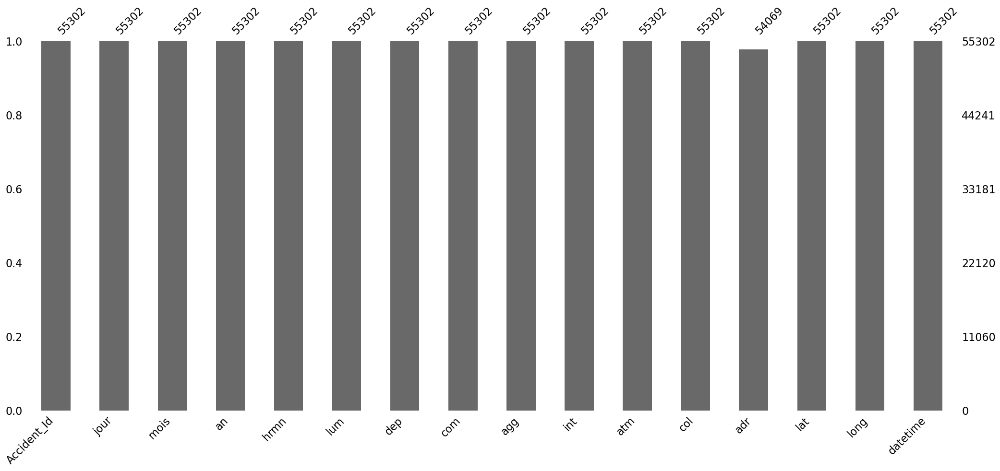

In [17]:
msno.bar(caracteristiques)

<Axes: >

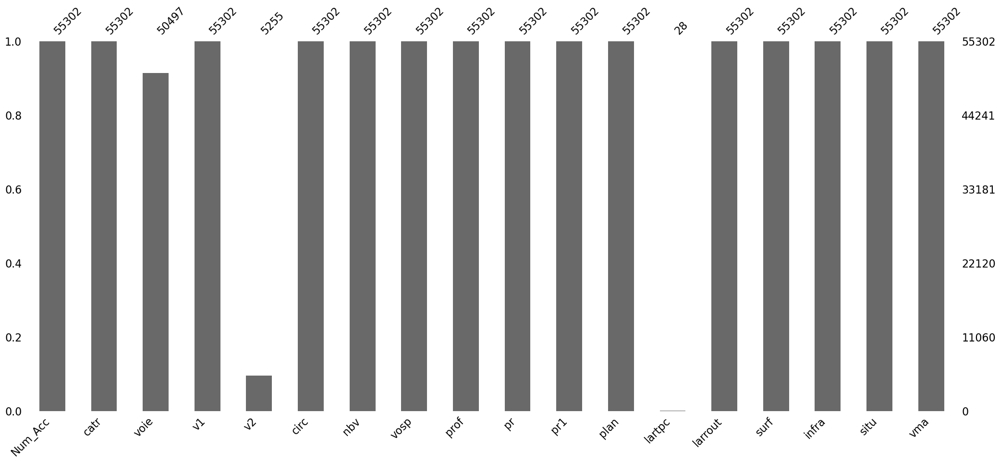

In [18]:
msno.bar(lieux)

<Axes: >

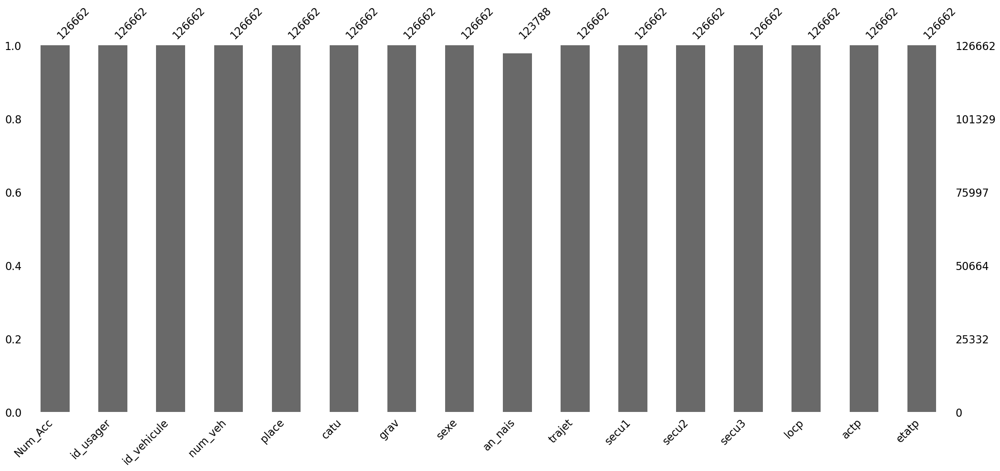

In [19]:
msno.bar(usagers)

<Axes: >

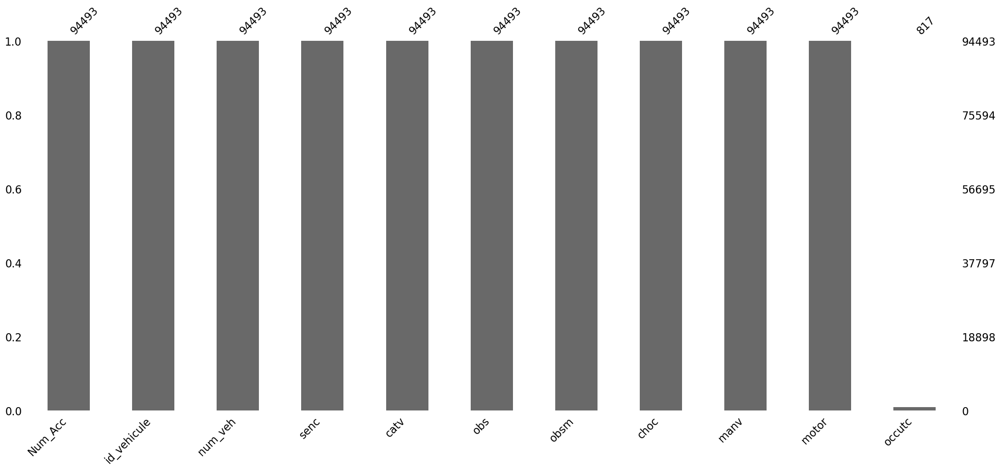

In [20]:
msno.bar(vehicules)

# Analyse temporelle

In [22]:
#caracteristiques = caracteristiques.sort_values(by='jour')

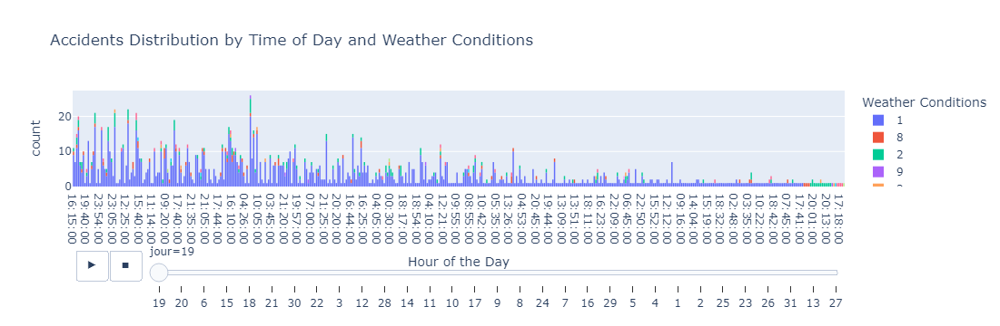

In [23]:
import plotly.express as px

# Create a histogram with animations
fig = px.histogram(caracteristiques, 
                   x="hrmn",  # X-axis for time (hours of the day)
                   animation_frame="jour",  # Animate by day
                   color="atm",  # Color by weather conditions
                   title="Accidents Distribution by Time of Day and Weather Conditions",
                   labels={"hrmn": "Hour of the Day", "atm": "Weather Conditions"},
                   nbins=24)  # 24 bins to represent each hour of the day

# Show the plot
fig.show()


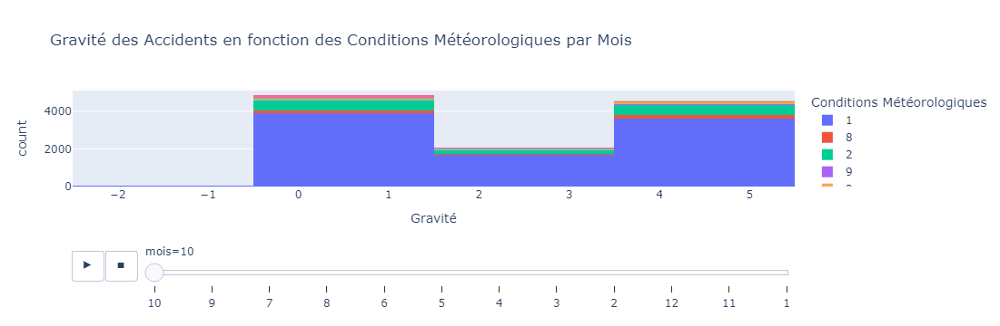

In [35]:
import plotly.express as px
# Créer un histogramme interactif avec animation
fig = px.histogram(merged_ca_us, 
                   x="grav",  # Gravité de l'accident
                   animation_frame="mois",  # Animation par mois
                   color="atm",  # Conditions météorologiques
                   title="Gravité des Accidents en fonction des Conditions Météorologiques par Mois",
                   labels={"grav": "Gravité", "atm": "Conditions Météorologiques"},
                   nbins=5)  # Ajuster le nombre de bacs

# Afficher la visualisation
fig.show()


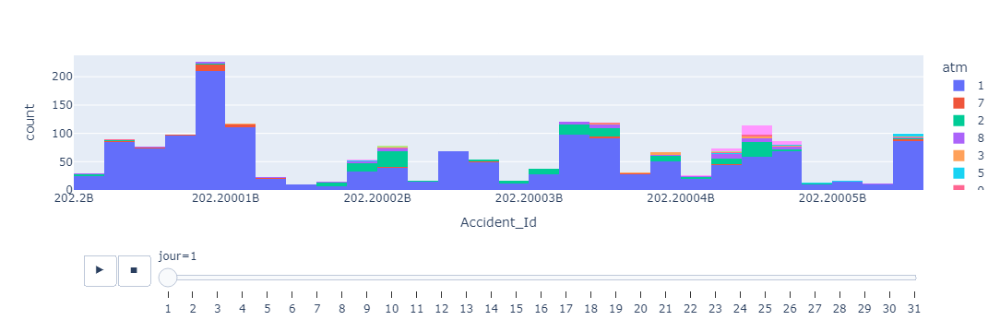

In [23]:
import plotly.express as px
fig = px.histogram(caracteristiques, x="Accident_Id", animation_frame="jour", color="atm")
fig.show()

In [24]:
caracteristiques['hour'] = caracteristiques['datetime'].dt.hour

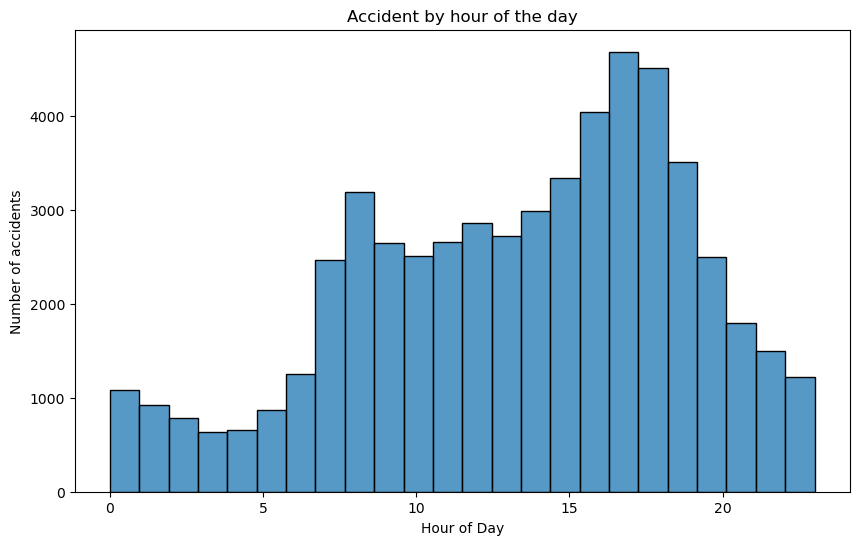

In [25]:
plt.figure(figsize=(10,6))
sns.histplot(caracteristiques['hour'], bins=24)
plt.title('Accident by hour of the day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of accidents')
plt.show()

C:\Users\solya\AppData\Local\Temp\ipykernel_2768\576931441.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




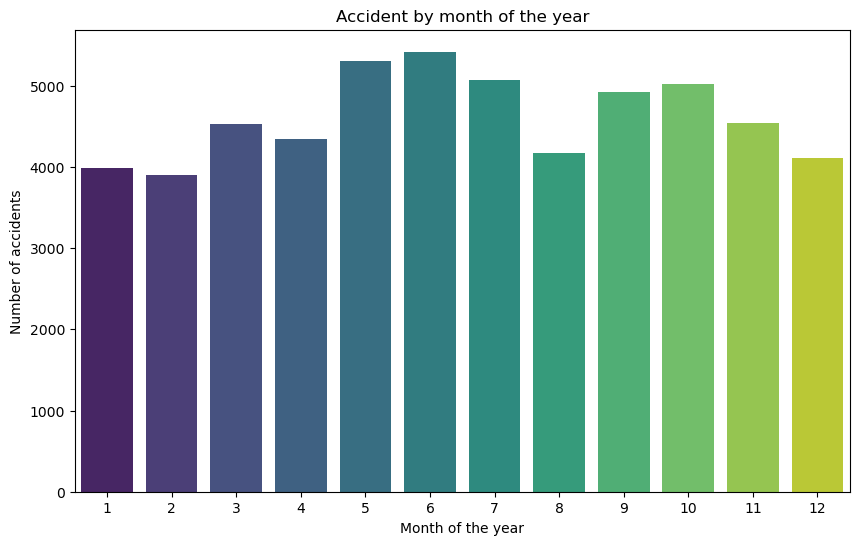

In [26]:
plt.figure(figsize=(10,6))
sns.countplot(x='mois', data=caracteristiques, palette='viridis')
plt.title('Accident by month of the year')
plt.xlabel('Month of the year')
plt.ylabel('Number of accidents')
plt.show()

C:\Users\solya\AppData\Local\Temp\ipykernel_2768\697028219.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




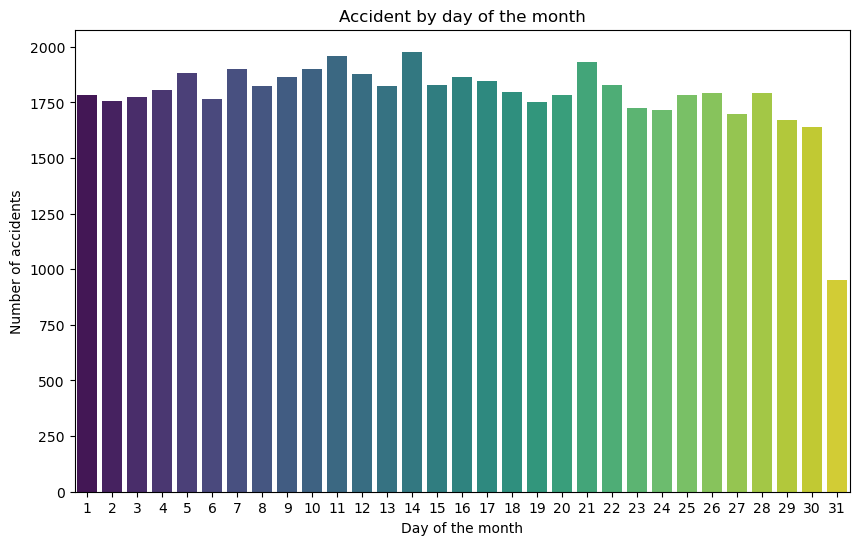

In [27]:
plt.figure(figsize=(10,6))
sns.countplot(x='jour', data=caracteristiques, palette='viridis')
plt.title('Accident by day of the month')
plt.xlabel('Day of the month')
plt.ylabel('Number of accidents')
plt.show()

In [28]:
caracteristiques['weekday'] = caracteristiques['datetime'].dt.weekday

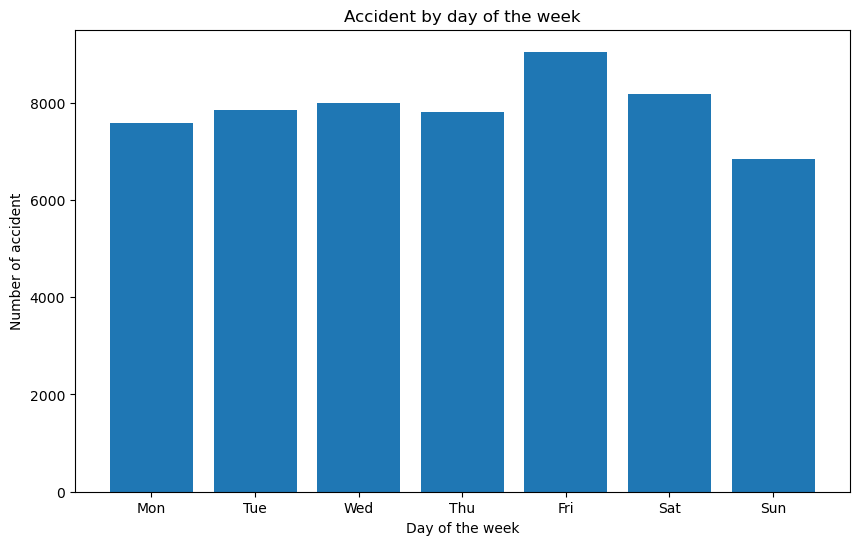

In [29]:
plt.figure(figsize=(10,6))
plt.hist(caracteristiques.weekday, bins=7, rwidth = 0.8, range=(-.5,6.5))
plt.xlabel('Day of the week')
plt.ylabel('Number of accident')
plt.xticks(np.arange(7), 'Mon Tue Wed Thu Fri Sat Sun'.split())
plt.title('Accident by day of the week');

# Analyse des lieux

In [31]:
print(caracteristiques['lat'].dtype)
print(caracteristiques['long'].dtype)

object
object


In [32]:
caracteristiques['lat'] = caracteristiques['lat'].str.replace(',', '.', regex=False)
caracteristiques['long'] = caracteristiques['long'].str.replace(',', '.', regex=False)

In [33]:
caracteristiques['lat'] = pd.to_numeric(caracteristiques['lat'], errors='coerce')
caracteristiques['long'] = pd.to_numeric(caracteristiques['long'], errors='coerce')

In [35]:
print(caracteristiques['lat'].dtype)
print(caracteristiques['long'].dtype)

float64
float64


In [36]:
print(caracteristiques['lat'].min(), caracteristiques['lat'].max())
print(caracteristiques['long'].min(), caracteristiques['long'].max())

-23.373 51.072044
-176.201857 168.033384


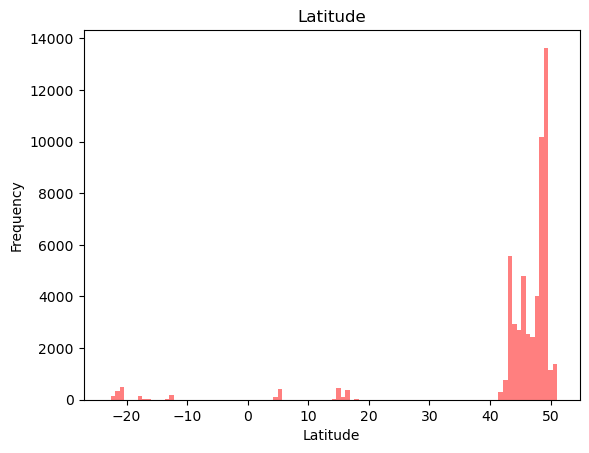

In [37]:
plt.hist(caracteristiques['lat'], bins=100, range=(-23.373, 51.072044), color='r', alpha=0.5)
plt.xlabel('Latitude')
plt.ylabel('Frequency')
plt.title('Latitude');

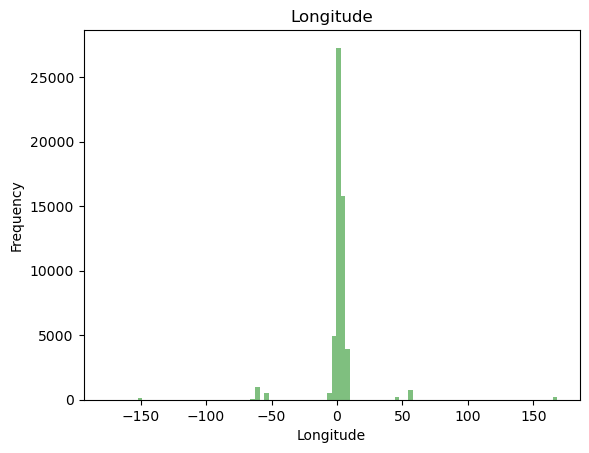

In [38]:
plt.hist(caracteristiques['long'], bins=100, range=(-176.201857, 168.033384), color='g', alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Frequency')
plt.title('Longitude');

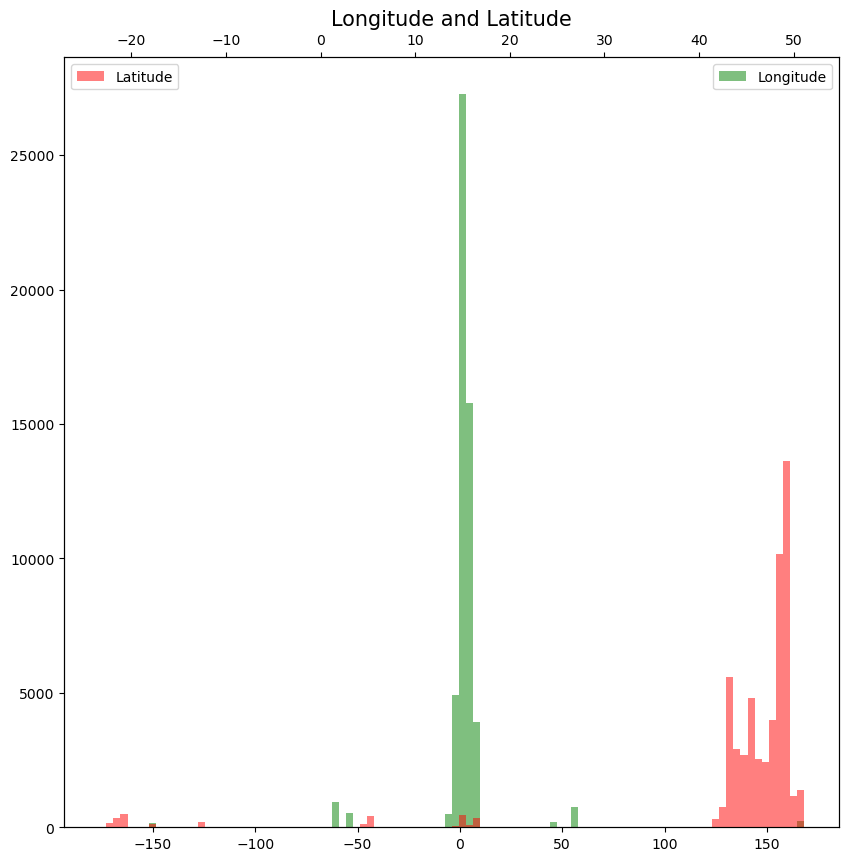

In [39]:
plt.figure(figsize=(10, 10), dpi = 100)
plt.title('Longitude and Latitude', fontsize=15)
plt.hist(caracteristiques['long'], bins = 100, range=(-176.201857, 168.033384), color = 'g', alpha = 0.5, label = 'Longitude')
plt.legend(loc = 'best')
plt.twiny()
plt.hist(caracteristiques['lat'], bins = 100, range=(-23.373, 51.072044), color = 'r', alpha = 0.5, label = 'Latitude')
plt.legend(loc = 'upper left')
plt.show()

(-23.373, 51.072044)

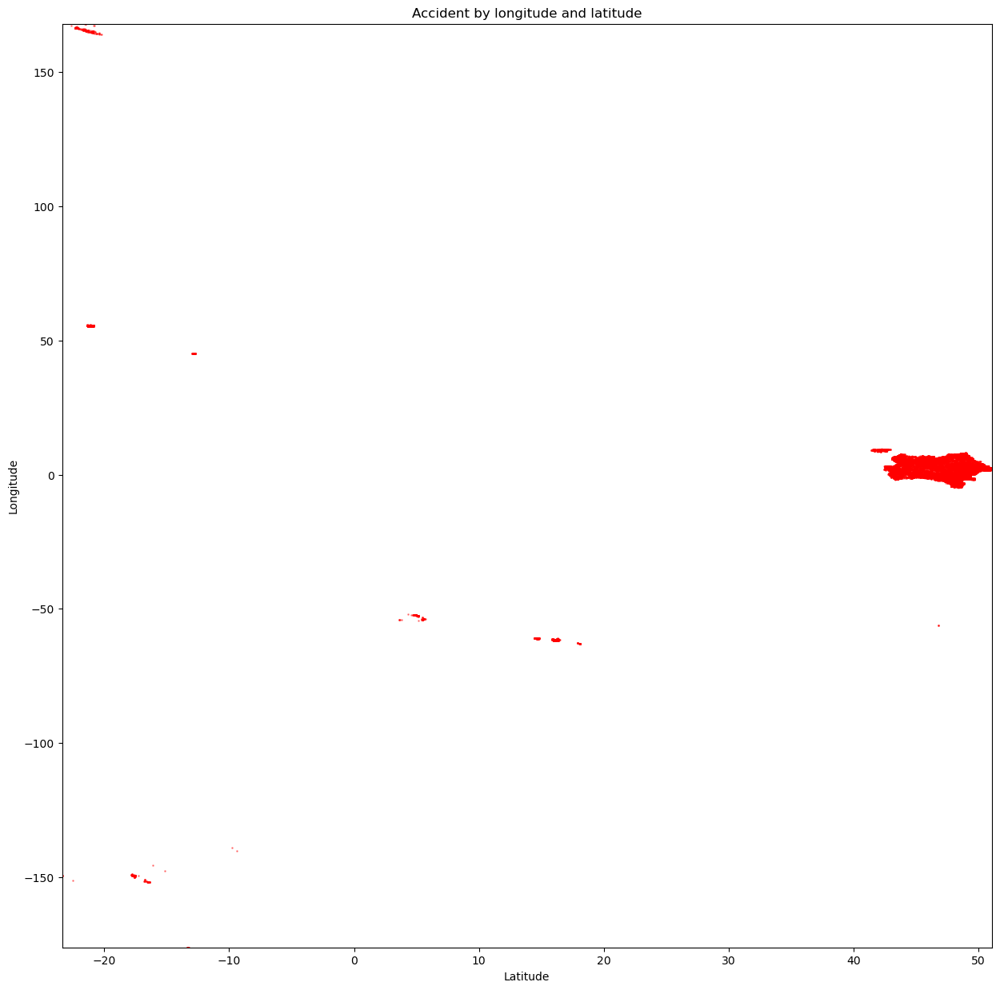

In [40]:
plt.figure(figsize=(15, 15), dpi=100)
plt.title('Accident by longitude and latitude')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.scatter(caracteristiques['lat'], caracteristiques['long'], color='r', s=0.8, alpha=0.4)
plt.ylim(-176.201857, 168.033384)
plt.xlim(-23.373, 51.072044)

In [42]:
!pip install geopy folium

Note: you may need to restart the kernel to use updated packages.


In [48]:
import folium
from folium.plugins import HeatMap

In [55]:
map_center = [caracteristiques['lat'].mean(), caracteristiques['long'].mean()]
map_ = folium.Map(location=map_center, zoom_start=6)

In [56]:
for index, row in caracteristiques.iterrows():
    folium.CircleMarker(
        location=(row['lat'], row['long']),
        radius=5,  # Taille du cercle
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.6,
        popup=f"Accident {index + 1}"
    ).add_to(map_)

map_.save('accidents_map.html')

In [58]:
heatmap = folium.Map(location=map_center, zoom_start=6)
heat_data = [[row['lat'], row['long']] for index, row in caracteristiques.iterrows()]
HeatMap(heat_data).add_to(heatmap)
heatmap.save('heatmap_accidents.html')

# Types de routes et accidents

In [61]:
accidents_par_type = lieux.groupby('catr')['Num_Acc'].sum()

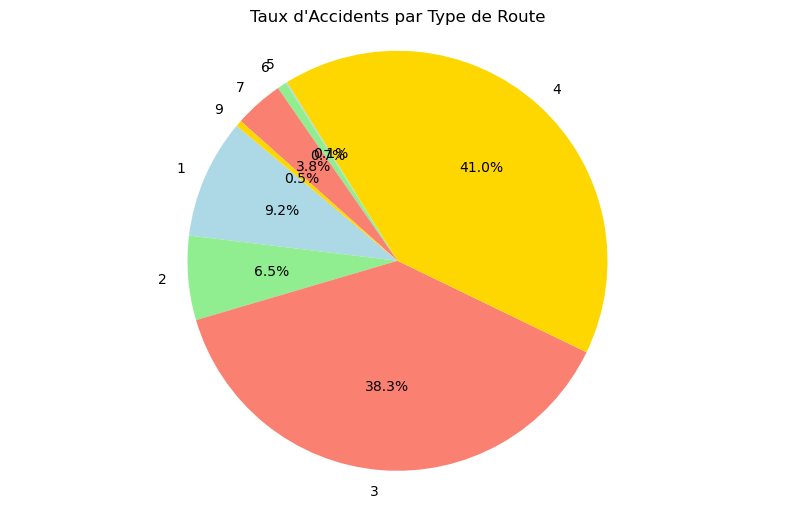

In [65]:
plt.figure(figsize=(10, 6))
plt.pie(accidents_par_type, labels=accidents_par_type.index, autopct='%1.1f%%', startangle=140, colors=['lightblue', 'lightgreen', 'salmon', 'gold'])
plt.title('Taux d\'Accidents par Type de Route')
plt.axis('equal')
plt.show()

# Analyse des Conditions de l'Accident

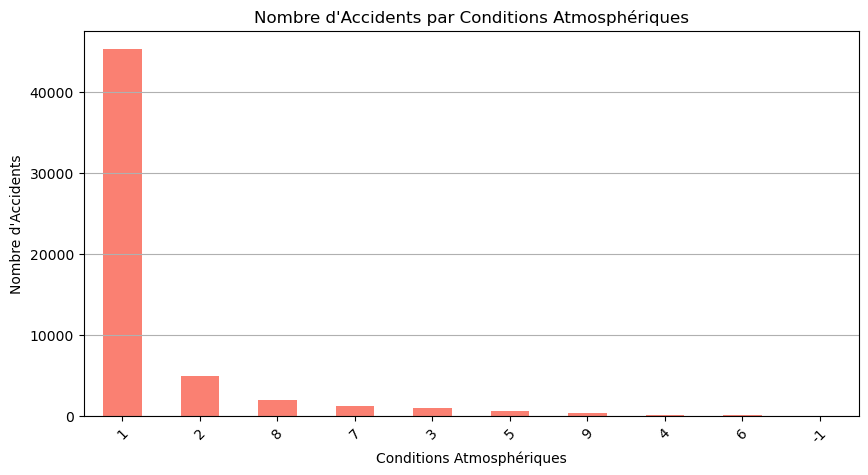

In [131]:
atm_counts = caracteristiques['atm'].value_counts()
plt.figure(figsize=(10, 5))
atm_counts.plot(kind='bar', color='salmon')
plt.title('Nombre d\'Accidents par Conditions Atmosphériques')
plt.xlabel('Conditions Atmosphériques')
plt.ylabel('Nombre d\'Accidents')
plt.xticks(ticks=range(len(atm_counts)), rotation=45)
plt.grid(axis='y')
plt.show()

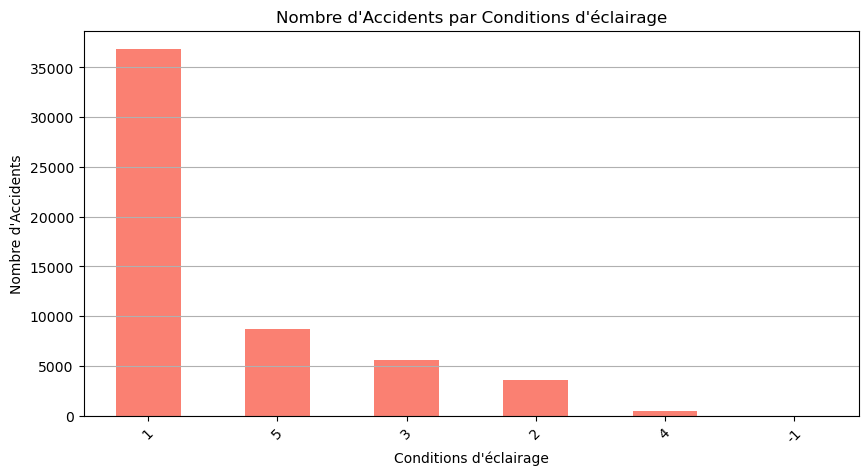

In [151]:
lum_counts = caracteristiques['lum'].value_counts()
plt.figure(figsize=(10, 5))
lum_counts.plot(kind='bar', color='salmon')
plt.title('Nombre d\'Accidents par Conditions d\'éclairage')
plt.xlabel('Conditions d\'éclairage')
plt.ylabel('Nombre d\'Accidents')
plt.xticks(ticks=range(len(lum_counts)), rotation=45)
plt.grid(axis='y')
plt.show()

In [171]:
pivot_table = pd.crosstab(caracteristiques['lum'], caracteristiques['atm'], 
                           rownames=['Conditions d\'éclairage'], 
                           colnames=['Conditions Atmosphériques'], 
                           margins=False)

In [173]:
pivot_table.head()

Conditions Atmosphériques,-1,1,2,3,4,5,6,7,8,9
Conditions d'éclairage,,,,,,,,,,
-1,1,1,0,0,0,0,0,0,0,0
1,0,31367,2384,443,59,130,67,1053,1251,91
2,0,2658,386,91,17,103,10,89,203,32
3,0,4184,754,189,33,182,27,1,190,68
4,0,381,69,19,1,15,1,0,16,9


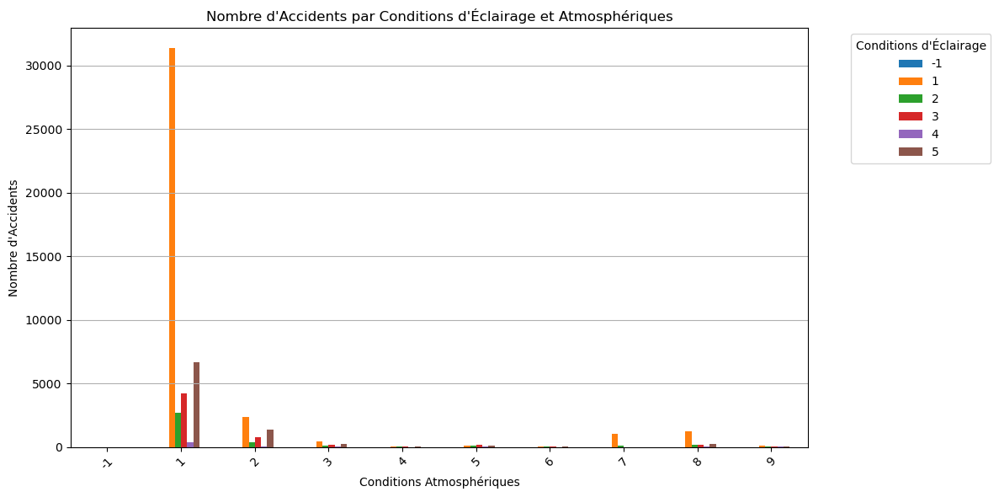

In [224]:
pivot_table.T.plot(kind='bar', figsize=(12, 6), color=plt.cm.tab10.colors)
plt.title('Nombre d\'Accidents par Conditions d\'Éclairage et Atmosphériques')
plt.xlabel('Conditions Atmosphériques')
plt.ylabel('Nombre d\'Accidents')
plt.xticks(rotation=45)
plt.legend(title='Conditions d\'Éclairage', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

C:\Users\solya\AppData\Local\Temp\ipykernel_2768\4074555292.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




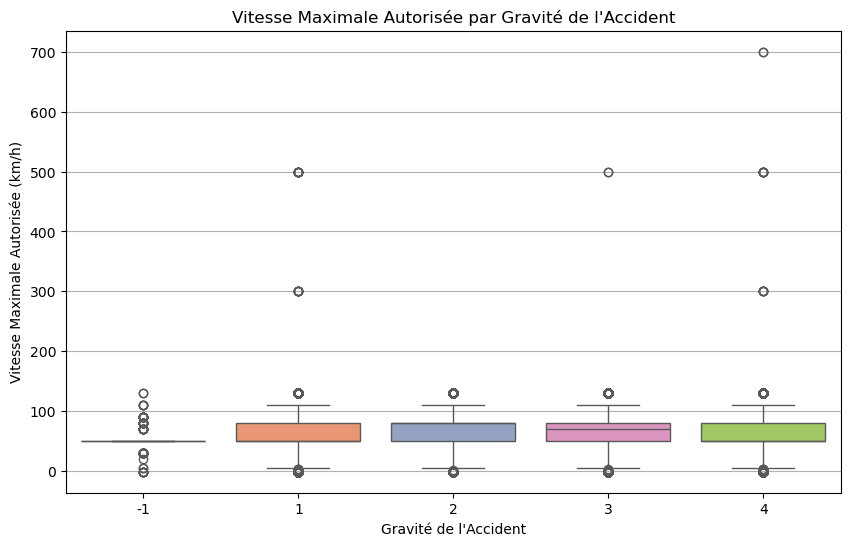

Correlation entre vitesse et gravité : -0.006116283749849119


In [183]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='grav', y='vma', data=merged_us_li, palette='Set2')
plt.title('Vitesse Maximale Autorisée par Gravité de l\'Accident')
plt.xlabel('Gravité de l\'Accident')
plt.ylabel('Vitesse Maximale Autorisée (km/h)')
plt.grid(axis='y')
plt.show()

# Calculer la corrélation
correlation = merged_us_li['vma'].corr(merged_us_li['grav'])
print(f'Correlation entre vitesse et gravité : {correlation}')

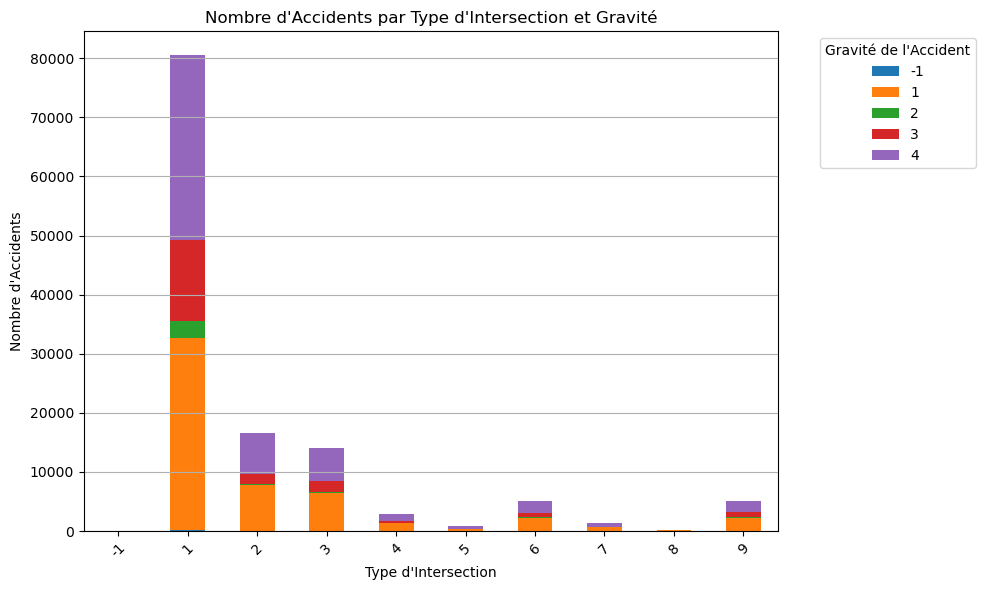

In [205]:
intersection_counts = merged_ca_us.groupby(['int', 'grav']).size().unstack(fill_value=0)

intersection_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=plt.cm.tab10.colors)
plt.title('Nombre d\'Accidents par Type d\'Intersection et Gravité')
plt.xlabel('Type d\'Intersection')
plt.ylabel('Nombre d\'Accidents')
plt.xticks(ticks=range(len(intersection_counts.index)), rotation=45)
plt.legend(title='Gravité de l\'Accident', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# Analyse des Victimes et des Blessures

C:\Users\solya\AppData\Local\Temp\ipykernel_2768\3203446819.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




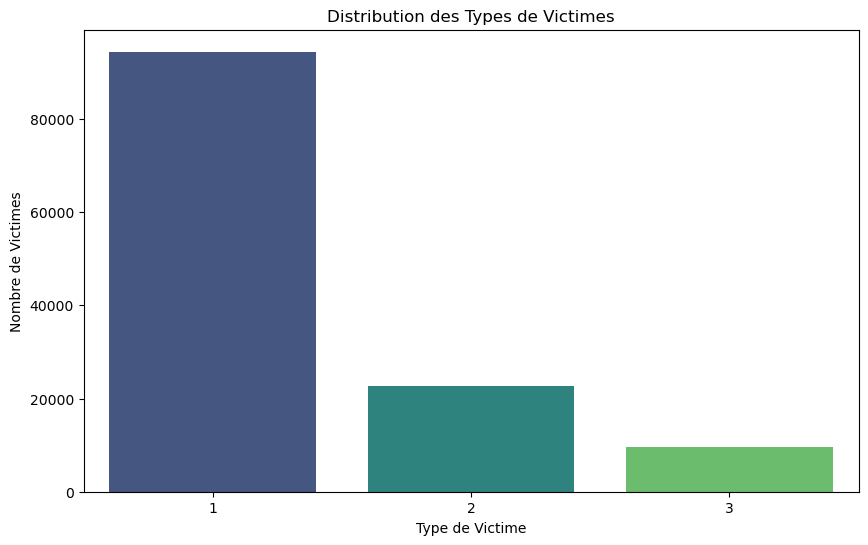

In [210]:
plt.figure(figsize=(10,6))
sns.countplot(x='catu', data=usagers, palette='viridis')
plt.title('Distribution des Types de Victimes')
plt.xlabel('Type de Victime')
plt.ylabel('Nombre de Victimes')
plt.show()

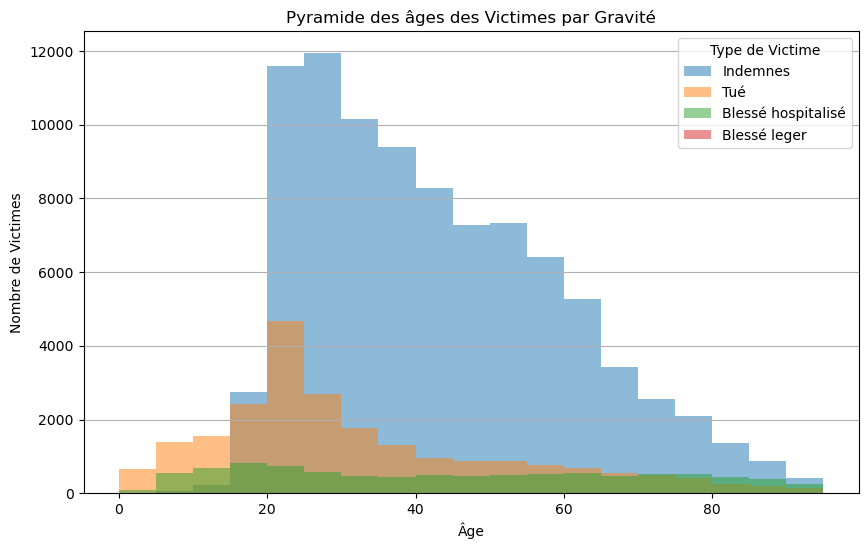

In [37]:
current_year = 2024
usagers['age'] = current_year - usagers['an_nais']

victim_types = {
    1: 'Indemnes',
    2: 'Tué',
    3: 'Blessé hospitalisé',
    4: 'Blessé leger'
}
usagers['gravite'] = usagers['catu'].map(victim_types)
plt.figure(figsize=(10, 6))
for g in victim_types.values():
    plt.hist(usagers[usagers['gravite'] == g]['age'], bins=range(0, 100, 5), alpha=0.5, label=g)

plt.title('Pyramide des âges des Victimes par Gravité')
plt.xlabel('Âge')
plt.ylabel('Nombre de Victimes')
plt.legend(title='Type de Victime')
plt.grid(axis='y')
plt.show()

In [39]:
usagers.head()

,Num_Acc,id_usager,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,secu2,secu3,locp,actp,etatp,age,gravite
0,202200000001,1 099 700,813 952,A01,1,1,3,1,2008.0,5,2,8,-1,-1,-1,-1,16.0,Indemnes
1,202200000001,1 099 701,813 953,B01,1,1,1,1,1948.0,5,1,8,-1,-1,-1,-1,76.0,Indemnes
2,202200000002,1 099 698,813 950,B01,1,1,4,1,1988.0,9,1,0,-1,0,0,-1,36.0,Indemnes
3,202200000002,1 099 699,813 951,A01,1,1,1,1,1970.0,4,1,0,-1,0,0,-1,54.0,Indemnes
4,202200000003,1 099 696,813 948,A01,1,1,1,1,2002.0,0,1,0,-1,-1,-1,-1,22.0,Indemnes


In [222]:
current_year = 2024
usagers['age'] = current_year - usagers['an_nais']
plt.figure(figsize=(10, 6))
for g in usagers['grav'].values():
    plt.hist(usagers['grav'] == g['age'], bins=range(0, 100, 5), alpha=0.5, label=g)

plt.title('Pyramide des âges des Victimes par Gravité')
plt.xlabel('Âge')
plt.ylabel('Nombre de Victimes')
plt.legend(title='Type de Victime')
plt.grid(axis='y')
plt.show()

TypeError: 'numpy.ndarray' object is not callable

<Figure size 1000x600 with 0 Axes>

# Analyse des Véhicules Impliqués

In [227]:
vehicules_counts = vehicules['catv'].value_counts()

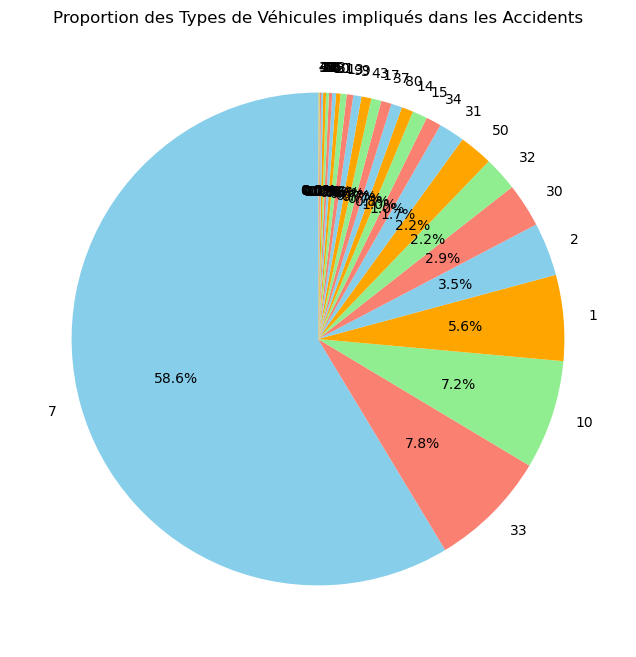

In [231]:
plt.figure(figsize=(8, 8))
vehicules_counts.plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=['skyblue', 'salmon', 'lightgreen', 'orange'])
plt.title('Proportion des Types de Véhicules impliqués dans les Accidents')
plt.ylabel('')
plt.show()

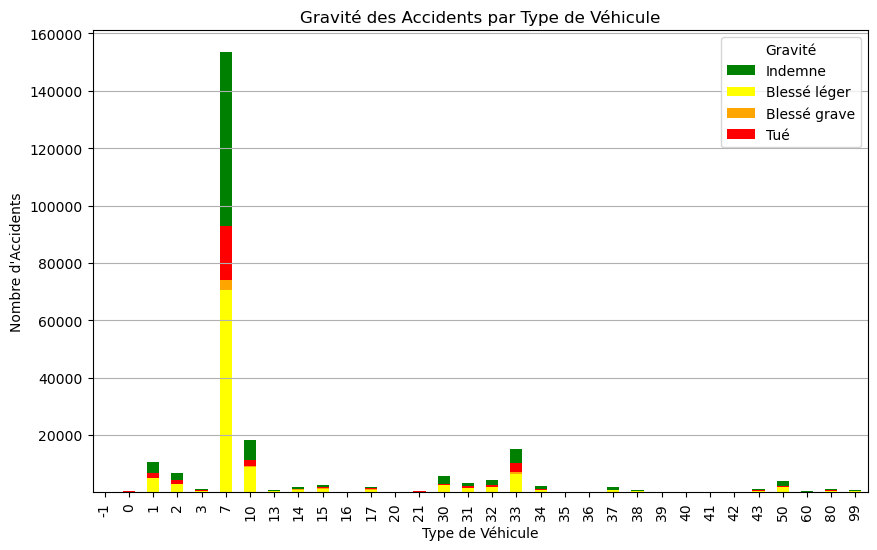

In [235]:
grav_by_vehicle = merged_vh_us.groupby(['catv', 'grav']).size().unstack(fill_value=0)
grav_by_vehicle.plot(kind='bar', stacked=True, figsize=(10, 6), color=['green', 'yellow', 'orange', 'red'])
plt.title('Gravité des Accidents par Type de Véhicule')
plt.xlabel('Type de Véhicule')
plt.ylabel('Nombre d\'Accidents')
plt.legend(title='Gravité', labels=['Indemne', 'Blessé léger', 'Blessé grave', 'Tué'])
plt.grid(axis='y')
plt.show()

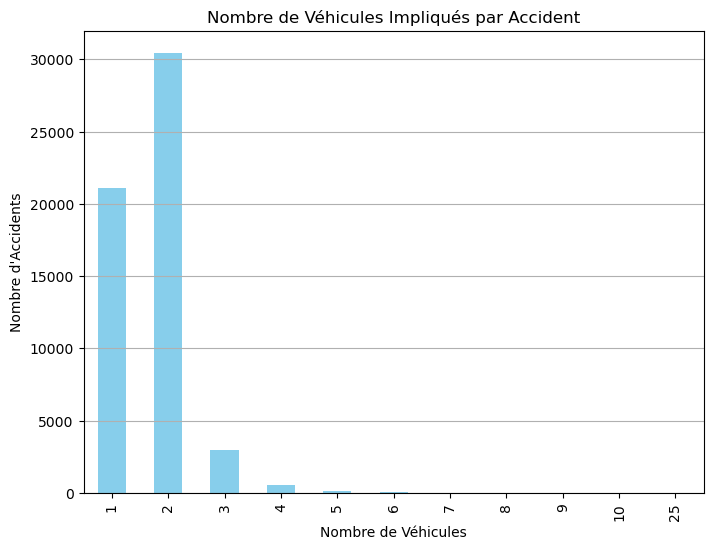

In [237]:
vehicules_par_accident = vehicules.groupby('Num_Acc').size()
plt.figure(figsize=(8, 6))
vehicules_par_accident.value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title('Nombre de Véhicules Impliqués par Accident')
plt.xlabel('Nombre de Véhicules')
plt.ylabel('Nombre d\'Accidents')
plt.grid(axis='y')
plt.show()

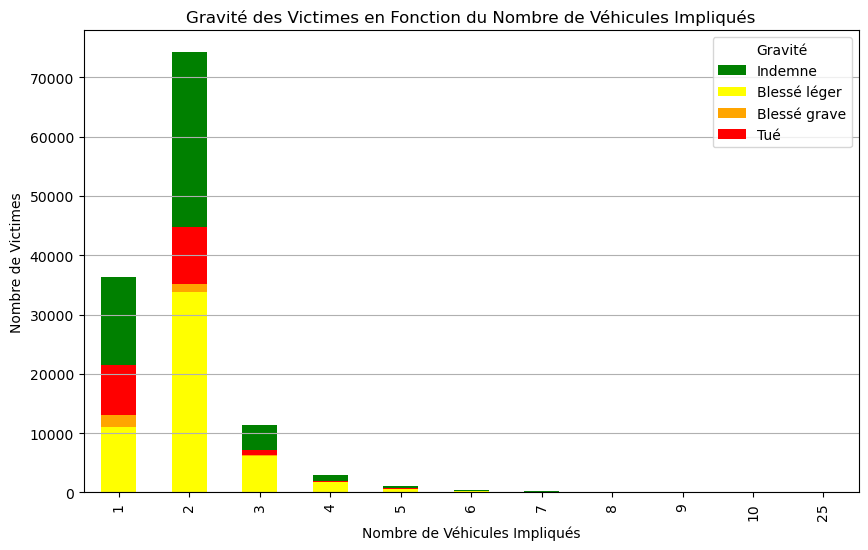

In [239]:
vehicules_par_accident = vehicules.groupby('Num_Acc').size().reset_index(name='nb_vehicules')
accidents_gravite_vehicules = pd.merge(vehicules_par_accident, usagers[['Num_Acc', 'grav']], on='Num_Acc')
gravite_vehicules_count = accidents_gravite_vehicules.groupby(['nb_vehicules', 'grav']).size().unstack(fill_value=0)
gravite_vehicules_count.plot(kind='bar', stacked=True, figsize=(10, 6), color=['green', 'yellow', 'orange', 'red'])
plt.title('Gravité des Victimes en Fonction du Nombre de Véhicules Impliqués')
plt.xlabel('Nombre de Véhicules Impliqués')
plt.ylabel('Nombre de Victimes')
plt.legend(title='Gravité', labels=['Indemne', 'Blessé léger', 'Blessé grave', 'Tué'])
plt.grid(axis='y')
plt.show()

# Corrélation et Facteurs de Risque

In [242]:
variables_interessantes = ['catr', 'atm', 'hrmn', 'lum', 'nbv', 'grav']
df_corr = caracteristiques[['catr', 'atm', 'hrmn', 'lum']].copy()
df_corr = df_corr.merge(usagers[['Num_Acc', 'grav']], on='Num_Acc')
df_corr.replace(-1, np.nan, inplace=True)
corr_matrix = df_corr.corr()
plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Matrice de Corrélation entre les Facteurs et la Gravité des Accidents')
plt.show()

KeyError: "['catr'] not in index"

C:\Users\solya\AppData\Local\Temp\ipykernel_2768\2764099173.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\solya\AppData\Local\Temp\ipykernel_2768\2764099173.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



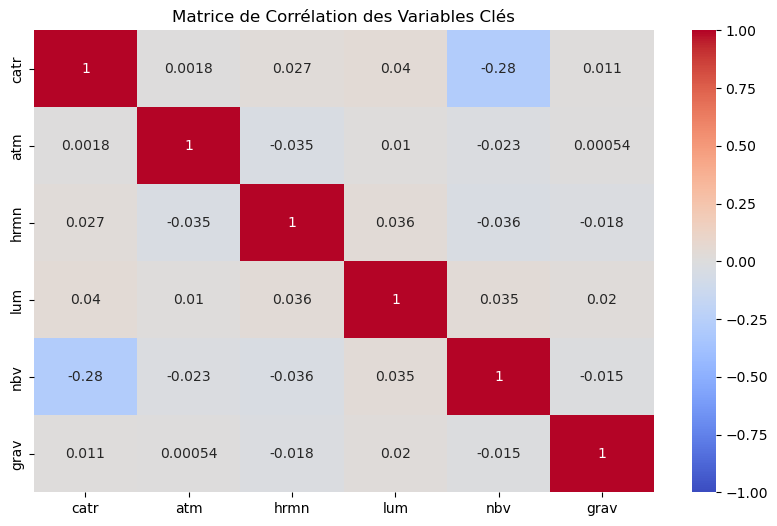

In [246]:
df_merged = caracteristiques.merge(lieux, on='Num_Acc').merge(usagers[['Num_Acc', 'grav']], on='Num_Acc')
variables_interessantes = ['catr', 'atm', 'hrmn', 'lum', 'nbv', 'grav']
df_corr = df_merged[variables_interessantes]
df_corr.replace(['#ERREUR', '-1'], np.nan, inplace=True)
df_corr['hrmn'] = pd.to_datetime(df_corr['hrmn'], format='%H:%M:%S', errors='coerce').dt.hour
df_corr = df_corr.apply(pd.to_numeric, errors='coerce')
correlation_matrix = df_corr.corr()
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Matrice de Corrélation des Variables Clés')
plt.show()

In [248]:
from sklearn.model_selection import train_test_split
X = df_corr.drop(columns=['grav'])
y = df_corr['grav']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [250]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')
print(classification_report(y_test, y_pred))

Accuracy: 0.4146765089014329
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00        49
           1       0.42      0.69      0.52     10719
           2       0.10      0.01      0.02       710
           3       0.31      0.09      0.14      3868
           4       0.41      0.28      0.33      9987

    accuracy                           0.41     25333
   macro avg       0.25      0.21      0.20     25333
weighted avg       0.39      0.41      0.37     25333



In [252]:
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f'Random Forest Accuracy: {accuracy_rf}')
print(classification_report(y_test, y_pred_rf))

Random Forest Accuracy: 0.4121501598705246
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00        49
           1       0.42      0.66      0.51     10719
           2       0.14      0.01      0.02       710
           3       0.31      0.08      0.13      3868
           4       0.41      0.31      0.35      9987

    accuracy                           0.41     25333
   macro avg       0.26      0.21      0.20     25333
weighted avg       0.39      0.41      0.38     25333



<Axes: >

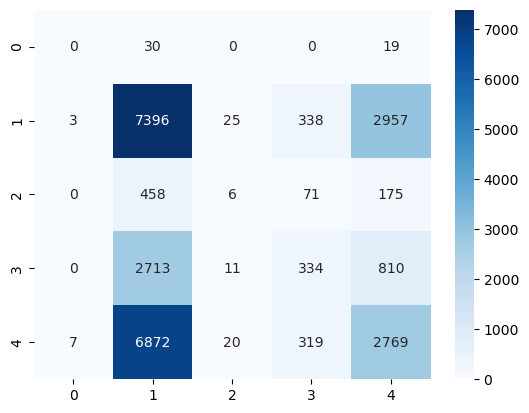

In [254]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

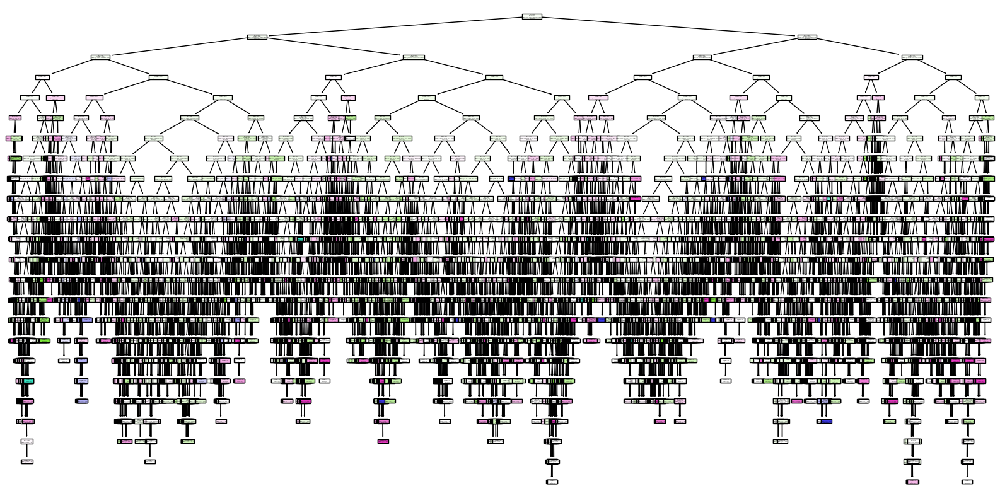

In [256]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))
plot_tree(model, feature_names=X.columns, filled=True, class_names=True)
plt.show()

In [257]:
importances = rf_model.feature_importances_
sorted_importances = sorted(zip(X.columns, importances), key=lambda x: x[1], reverse=True)
print(sorted_importances)

[('hrmn', 0.38366392890827117), ('nbv', 0.18483660424569098), ('atm', 0.17704552754792405), ('catr', 0.1467612814212427), ('lum', 0.10769265787687116)]


# fille et garcon

C:\Users\solya\AppData\Local\Temp\ipykernel_2768\1810897540.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




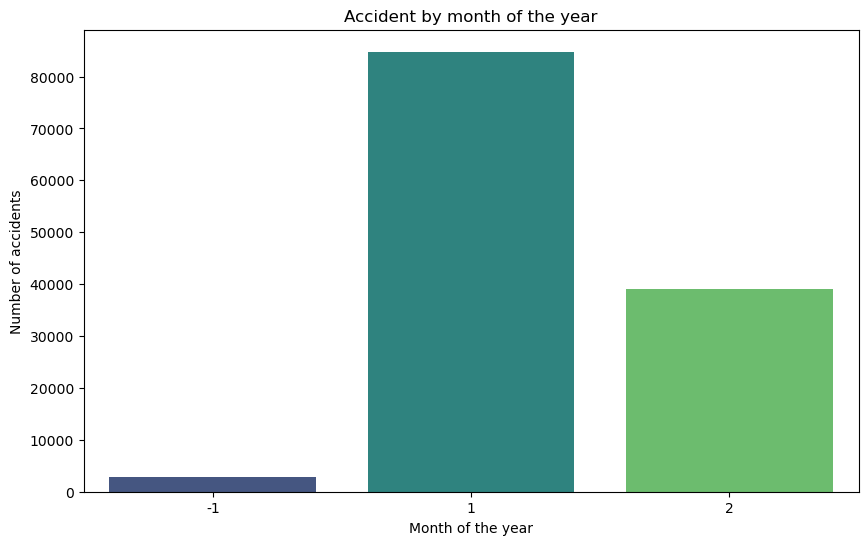

In [263]:
plt.figure(figsize=(10,6))
sns.countplot(x='sexe', data=usagers, palette='viridis')
plt.title('Accident by month of the year')
plt.xlabel('Month of the year')
plt.ylabel('Number of accidents')
plt.show()

In [93]:
!pip install jupytext

   ---------------------------------------- 0.0/153.5 kB ? eta -:--:--
   -- ------------------------------------- 10.2/153.5 kB ? eta -:--:--
   ----- --------------------------------- 20.5/153.5 kB 217.9 kB/s eta 0:00:01
   ---------- ---------------------------- 41.0/153.5 kB 388.9 kB/s eta 0:00:01
   ----------------------- --------------- 92.2/153.5 kB 655.4 kB/s eta 0:00:01
   -------------------------------------- 153.5/153.5 kB 833.1 kB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [101]:
!jupytext --to py Accident_notebook.ipynb

[jupytext] Reading Accident_notebook.ipynb in format ipynb
[jupytext] Writing Accident_notebook.py
